In [ ]:
import pandas as pd
import numpy as np

df = pd.read_excel('ML_Data2.xlsx', na_values=['_x0000_'])

cols_to_check = [
    '收盤價(元)_月', '報酬率％_月', '週轉率％_月', '流通在外股數(千股)',
    '市值(百萬元)', '股價淨值比-TEJ', '股價營收比-TEJ',
    '成交值比重％', '成交量(百萬股)_月', '成交值(百萬元)_月', '市值比重％',
    '高低價差%', '股價漲跌(元)'
]

# 檢查連續四個 NaN
def has_four_consecutive_nans(series):
    nan_str = ''.join(series.isna().astype(int).astype(str))
    return '111' in nan_str

companies_to_drop = []  # 要刪除的公司

for company, group in df.groupby('證券代碼'):
    if len(group) < 135:
        companies_to_drop.append(company)
        continue
    
    if not (((group['年月'] == 202503)).any()):
        companies_to_drop.append(company)
        continue
    
    for col in cols_to_check:
        if has_four_consecutive_nans(group[col]):
            companies_to_drop.append(company)
            break  

df_filtered = df[~df['證券代碼'].isin(companies_to_drop)].copy()

# NaN 補為 下一行的資料
df_filled = df_filtered.fillna(method='bfill')

print("需要刪除的公司：", companies_to_drop)
print(len(companies_to_drop))
print("最終保留資料：")
print(df_filled)
print(len(df_filled.groupby('證券代碼')))

/var/folders/w7/6fthp2hx0x9221ngq4h2hzcw0000gn/T/ipykernel_57934/1651526543.py:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_filled = df_filtered.fillna(method='bfill')


需要刪除的公司： ['0050 元大台灣50', '1432 大魯閣', '1465 偉全', '1472 三洋實業', '1805 寶徠', '2211 長榮鋼', '2337 旺宏', '2537 聯上發', '2633 台灣高鐵', '2646 星宇航空', '2753 八方雲集', '3702 大聯大', '3711 日月光投控', '5876 上海商銀', '6446 藥華藥', '6472 保瑞', '6756 威鋒電子', '6757 台灣虎航', '6770 力積電', '6776 展�眥篕�', '6838 台新藥', '6869 雲豹能源', '7722 LINEPAY', '9928 中視']
24
最終保留資料：
            證券代碼      年月 TEJ產業_代碼 TEJ產業_名稱  員工人數-母公司        統一編號        設立日期  \
243      1101 台泥  200501     M11A     水泥製造    1183.0  11913502.0  19501229.0   
244      1101 台泥  200502     M11A     水泥製造    1183.0  11913502.0  19501229.0   
245      1101 台泥  200503     M11A     水泥製造    1183.0  11913502.0  19501229.0   
246      1101 台泥  200504     M11A     水泥製造    1183.0  11913502.0  19501229.0   
247      1101 台泥  200505     M11A     水泥製造    1183.0  11913502.0  19501229.0   
248      1101 台泥  200506     M11A     水泥製造    1183.0  11913502.0  19501229.0   
249      1101 台泥  200507     M11A     水泥製造    1183.0  11913502.0  19501229.0   
250      1101 台泥  200508     M11A    

In [39]:
# 計算統計量
cols_to_summarize = cols_to_check  
company_stats = df_filled.groupby('證券代碼')[cols_to_summarize].agg(['mean', 'std', 'min', 'max', 'median'])
overall_stats = df_filled[cols_to_summarize].agg(['mean', 'std', 'min', 'max', 'median'])

print("\n各公司統計量")
print(company_stats)
print("\n整體資料統計量")
print(overall_stats)


各公司統計量
              收盤價(元)_月                                           報酬率％_月  \
                  mean          std    min      max    median      mean   
證券代碼                                                                      
1101 台泥      20.444650    10.105097   4.63    43.33    18.320  1.119933   
1102 亞泥      22.097737    11.023329   4.48    47.75    19.030  1.172040   
1201 味全      21.242140     8.184622   6.53    48.31    19.300  0.643972   
1216 統一      37.681934    22.745107   3.88    89.70    34.390  1.346213   
1217 愛之味      8.705062     2.308783   4.71    16.96     8.210  0.760800   
1234 黑松      21.146543     9.654687   5.11    42.75    22.240  1.072615   
1301 台塑      53.211893    22.467316  15.89    98.39    49.760  0.554271   
1304 台聚      11.785597     6.544398   2.57    34.71    11.020  0.958406   
1402 遠東新     19.869671     6.683953   6.34    38.40    19.480  0.850995   
1454 台富       7.155679     3.980839   2.44    18.65     6.490  0.945757   
1459 聯發       8.1

In [11]:
output_file = "final_result.xlsx"
df_filled.to_excel(output_file, index=False)

In [17]:
import pandas as pd
import numpy as np
from sklearn.linear_model import RidgeCV
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import matplotlib
from scipy.stats import ttest_rel, pearsonr
import shap
from sklearn.inspection import permutation_importance
matplotlib.rcParams['font.family'] = 'Arial Unicode MS'

data = pd.read_excel("final_result.xlsx")
data = data.sort_values(by=['證券代碼', '年月'])
data['年月'] = pd.to_datetime(data['年月'], format='%Y%m')

# 訓練長度
dates = sorted(data['年月'].unique())
half = len(dates) // 2
dates_to_predict = dates[half:-1]  

Ridge_results = []
XGBoost_results = []
Ridge_portfolio_record = []
XGBoost_portfolio_record = []
simple_avg_returns = []

# 考慮的變數
X_vars = ['收盤價(元)_月', '週轉率％_月', '流通在外股數(千股)', '市值(百萬元)',
          '股價淨值比-TEJ', '股價營收比-TEJ', '成交值比重％', '成交量(百萬股)_月',
          '成交值(百萬元)_月', '市值比重％', '高低價差%', '股價漲跌(元)']

# XGBoost
def manual_grid_search(X_train, y_train, X_val, y_val, param_grid):
    best_score = float('inf')
    best_params = {}
    best_model = None
    for max_depth in param_grid['max_depth']:
        for lr in param_grid['learning_rate']:
            for n_est in param_grid['n_estimators']:
                model = XGBRegressor(
                    objective='reg:squarederror',
                    max_depth=max_depth,
                    learning_rate=lr,
                    n_estimators=n_est,
                    random_state = 31073
                )
                model.fit(X_train, y_train)
                pred = model.predict(X_val)
                score = mean_squared_error(y_val, pred)
                if score < best_score:
                    best_score = score
                    best_params = {'max_depth': max_depth, 'learning_rate': lr, 'n_estimators': n_est}
                    best_model = model
    return best_model, best_params

# 主程式
for t in dates_to_predict:
    t_index = dates.index(t)
    if t_index + 1 >= len(dates):
        continue
    t_plus_1 = dates[t_index + 1]
    
    # 訓練 測試 資料
    train_data = data[data['年月'] < t].copy()
    train_data['y'] = train_data.groupby('證券代碼')['報酬率％_月'].shift(-1)
    train_data = train_data.dropna(subset=['y'])
    test_data_t = data[data['年月'] == t]  
    test_data_t_plus_1 = data[data['年月'] == t_plus_1]
    
    X = train_data[X_vars]
    y = train_data['y']
    X_test = test_data_t[X_vars]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_test_scaled = scaler.transform(X_test)
    
    # Train-validation split
    X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=1/3, random_state=31073)
    
    # -------------------------------
    # Ridge Regression
    ridge = RidgeCV(alphas=[0.01, 0.05, 0.1, 0.5, 1.0, 5.0, 10.0, 20.0, 30.0, 40.0, 50.0], store_cv_results=True)
    ridge.fit(X_train, y_train)
    pred_ridge = ridge.predict(X_test_scaled)
    
    # Store Ridge predictions
    temp = test_data_t.copy()
    temp['pred_ridge'] = pred_ridge
    temp['best_alpha'] = ridge.alpha_
    Ridge_results.append(temp)
    
    # Quartile grouping based on predictions
    
    temp['group'] = pd.qcut(temp['pred_ridge'], 4, labels=False )
    
    # Match stocks in each group to their actual t+1 returns
    group_returns = {}
    for group in range(4):
        stock_codes = temp[temp['group'] == group]['證券代碼']
        actual_returns = test_data_t_plus_1[test_data_t_plus_1['證券代碼'].isin(stock_codes)]['報酬率％_月']
        group_returns[group] = actual_returns.mean() if not actual_returns.empty else 0
    
    R_D = {
        'D1': group_returns.get(3, 0),  # 第一分位
        'D2': group_returns.get(2, 0),  # 第二分位
        'D3': group_returns.get(1, 0),  # 第三分位
        'D4': group_returns.get(0, 0)   # 第四分位
    }
    
    Ridge_portfolio_record.append({
        'date': t_plus_1, 
        **{k: v * 12 for k, v in R_D.items()},  # 年化 return
        'RLS': (R_D['D1'] - R_D['D4']) * 12,    # 年化 RLS
        'best_alpha': ridge.alpha_
    })
    # -------------------------------

    # -------------------------------
    # XGBoost Regressor
    param_grid = {
        'max_depth': [3, 5, 7, 9, 11],
        'learning_rate': [0.01, 0.1, 1.0],
        'n_estimators': [100, 200, 300, 400, 500]
    }
    best_xgb, best_params = manual_grid_search(X_train, y_train, X_val, y_val, param_grid)
    pred_xgb = best_xgb.predict(X_test_scaled)
    
    # Store XGBoost predictions
    temp = test_data_t.copy()
    temp['pred_xgb'] = pred_xgb
    for k, v in best_params.items():
        temp[k] = v
    XGBoost_results.append(temp)
    
    # Quartile grouping based on predictions
    temp['group'] = pd.qcut(temp['pred_xgb'], 4, labels=False, duplicates='drop')
    
    # Match stocks in each group to their actual t+1 returns
    group_returns = {}
    for group in range(4):
        stock_codes = temp[temp['group'] == group]['證券代碼']
        actual_returns = test_data_t_plus_1[test_data_t_plus_1['證券代碼'].isin(stock_codes)]['報酬率％_月']
        group_returns[group] = actual_returns.mean() if not actual_returns.empty else 0
    
    R_D = {
        'D1': group_returns.get(3, 0),  # 第一分位
        'D2': group_returns.get(2, 0),  # 第二分位
        'D3': group_returns.get(1, 0),  # 第三分位
        'D4': group_returns.get(0, 0)   # 第四分位
    }
    
    XGBoost_portfolio_record.append({
        'date': t_plus_1, 
        **{k: v * 12 for k, v in R_D.items()},  # 年化 returns
        'RLS': (R_D['D1'] - R_D['D4']) * 12,    # 年化 RLS
        **best_params
    })
    # -------------------------------

    # Simple average return (annualized) for all stocks
    simple_avg_returns.append({
        'date': t_plus_1,
        'R_simple': test_data_t_plus_1['報酬率％_月'].mean() * 12
    })   

# Combine results
Ridge_portfolio_df = pd.DataFrame(Ridge_portfolio_record)
XGBoost_portfolio_df = pd.DataFrame(XGBoost_portfolio_record)
simple_avg_df = pd.DataFrame(simple_avg_returns)

# Compute and display R_simple statistics
r_simple_mean = simple_avg_df['R_simple'].mean()
r_simple_std = simple_avg_df['R_simple'].std()
r_simple_sharpe = r_simple_mean / r_simple_std if r_simple_std != 0 else np.nan  # Sharpe Ratio
print(f"\nR_simple Statistics (Annualized):")
print(f"Mean: {r_simple_mean:.4f}%")
print(f"Standard Deviation: {r_simple_std:.4f}%")
print(f"Sharpe Ratio: {r_simple_sharpe:.4f}")



R_simple Statistics (Annualized):
Mean: 12.5243%
Standard Deviation: 48.1598%
Sharpe Ratio: 0.2601


# Question 1: Mean and Mean-to-Volatility Ratio


Ridge Portfolio Statistics (Annualized):
                     Metric         D1         D2         D3         D4
0                      Mean  16.657393  12.739818  10.989164   9.666944
1                Volatility  71.005237  52.386229  40.813131  41.453944
2  Mean-to-Volatility Ratio   0.234594   0.243190   0.269256   0.233197
Is Ridge portfolio monotonically decreasing? True

XGBoost Portfolio Statistics (Annualized):
                     Metric         D1         D2         D3         D4
0                      Mean  13.582893  12.279233  10.562634  13.202920
1                Volatility  61.889434  45.556786  46.969405  51.675500
2  Mean-to-Volatility Ratio   0.219470   0.269537   0.224883   0.255497
Is XGBoost portfolio monotonically decreasing? False


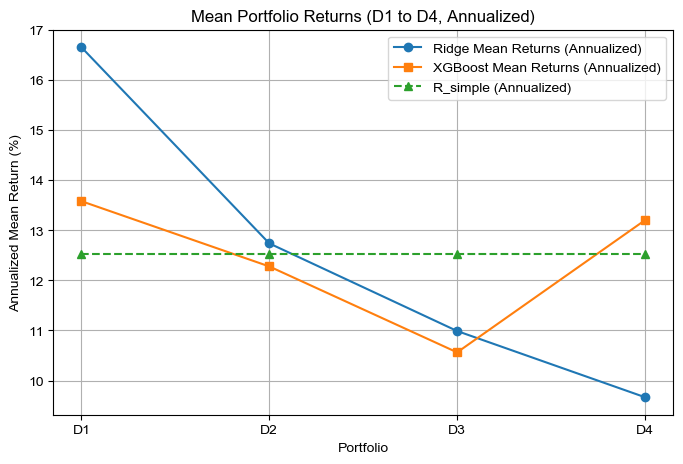

In [18]:

def compute_stats(df, model_name):
    stats = {
        'Metric': ['Mean', 'Volatility', 'Mean-to-Volatility Ratio'],
        'D1': [df['D1'].mean(), df['D1'].std(), df['D1'].mean() / df['D1'].std() if df['D1'].std() != 0 else np.nan],
        'D2': [df['D2'].mean(), df['D2'].std(), df['D2'].mean() / df['D2'].std() if df['D2'].std() != 0 else np.nan],
        'D3': [df['D3'].mean(), df['D3'].std(), df['D3'].mean() / df['D3'].std() if df['D3'].std() != 0 else np.nan],
        'D4': [df['D4'].mean(), df['D4'].std(), df['D4'].mean() / df['D4'].std() if df['D4'].std() != 0 else np.nan]
    }
    stats_df = pd.DataFrame(stats)
    print(f"\n{model_name} Portfolio Statistics (Annualized):")
    print(stats_df)
    
    # 檢查遞減
    means = [stats['D1'][0], stats['D2'][0], stats['D3'][0], stats['D4'][0]]
    is_monotonic = all(means[i] >= means[i+1] for i in range(len(means)-1))
    print(f"Is {model_name} portfolio monotonically decreasing? {is_monotonic}")
    
    return stats_df

ridge_stats = compute_stats(Ridge_portfolio_df, "Ridge")
xgb_stats = compute_stats(XGBoost_portfolio_df, "XGBoost")

# # Display best_alpha for Ridge
# print(f"\nRidge Best Alpha Values (Annualized):")
# print(Ridge_portfolio_df[['date', 'best_alpha']])

# Plot mean returns for D1-D4 (both Ridge and XGBoost)
r_simple_mean = simple_avg_df['R_simple'].mean()
plt.figure(figsize=(8, 5))
plt.plot(['D1', 'D2', 'D3', 'D4'], ridge_stats.loc[0, ['D1', 'D2', 'D3', 'D4']], label='Ridge Mean Returns (Annualized)', marker='o')
plt.plot(['D1', 'D2', 'D3', 'D4'], xgb_stats.loc[0, ['D1', 'D2', 'D3', 'D4']], label='XGBoost Mean Returns (Annualized)', marker='s')
plt.plot(['D1', 'D2', 'D3', 'D4'], [r_simple_mean]*4, label='R_simple (Annualized)', marker='^', linestyle='--')
plt.title('Mean Portfolio Returns (D1 to D4, Annualized)')
plt.xlabel('Portfolio')
plt.ylabel('Annualized Mean Return (%)')
plt.legend()
plt.grid()
plt.savefig('portfolio_mean_returns_annualized.png')

# Question 2: Compare RLS mean and mean-to-volatility ratio

In [ ]:
def compare_rls_stats(ridge_df, xgb_df):
    ridge_mean = ridge_df['RLS'].mean()
    ridge_vol = ridge_df['RLS'].std()
    ridge_ratio = ridge_mean / ridge_vol if ridge_vol != 0 else np.nan
    xgb_mean = xgb_df['RLS'].mean()
    xgb_vol = xgb_df['RLS'].std()
    xgb_ratio = xgb_mean / xgb_vol if xgb_vol != 0 else np.nan
    
    print("\nRLS Statistics Comparison (Annualized):")
    stats_df = pd.DataFrame({
        'Metric': ['Mean', 'Volatility', 'Mean-to-Volatility Ratio'],
        'Ridge': [ridge_mean, ridge_vol, ridge_ratio],
        'XGBoost': [xgb_mean, xgb_vol, xgb_ratio]
    })
    print(stats_df)
    print(f"\nDoes XGBoost have greater mean RLS? {xgb_mean > ridge_mean}")
    print(f"Does XGBoost have greater mean-to-vol ratio? {xgb_ratio > ridge_ratio}")
    
    return stats_df

rls_stats = compare_rls_stats(Ridge_portfolio_df, XGBoost_portfolio_df)


RLS Statistics Comparison (Annualized):
                     Metric      Ridge    XGBoost
0                      Mean   6.990449   0.379973
1                Volatility  46.017315  35.964371
2  Mean-to-Volatility Ratio   0.151909   0.010565

Does XGBoost have greater mean RLS? False
Does XGBoost have greater mean-to-vol ratio? False


# Question 3: Compare RLS to $R_{simple}$


Ridge Comparison (Annualized):
Annualized Mean RLS: 6.99%
Annualized Mean R_simple: 12.52%
RLS outperforms R_simple? False
Paired t-test p-value: 0.1379 (significant if < 0.05)

XGBoost Comparison (Annualized):
Annualized Mean RLS: 0.38%
Annualized Mean R_simple: 12.52%
RLS outperforms R_simple? False
Paired t-test p-value: 0.0118 (significant if < 0.05)


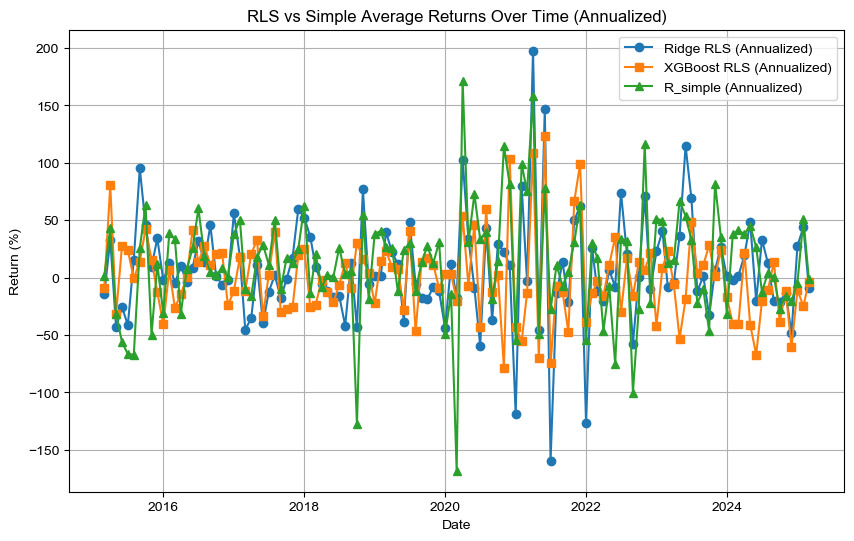

In [20]:
def compare_rls_to_simple(portfolio_df, simple_df, model_name):
    merged = portfolio_df.merge(simple_df, on='date')
    mean_rls = merged['RLS'].mean()
    mean_r_simple = merged['R_simple'].mean()
    print(f"\n{model_name} Comparison (Annualized):")
    print(f"Annualized Mean RLS: {mean_rls:.2f}%")
    print(f"Annualized Mean R_simple: {mean_r_simple:.2f}%")
    print(f"RLS outperforms R_simple? {mean_rls > mean_r_simple}")
    
    # Paired t-test
    t_stat, p_value = ttest_rel(merged['RLS'], merged['R_simple'])
    print(f"Paired t-test p-value: {p_value:.4f} (significant if < 0.05)")
    
    return merged

ridge_comparison = compare_rls_to_simple(Ridge_portfolio_df, simple_avg_df, "Ridge")
xgb_comparison = compare_rls_to_simple(XGBoost_portfolio_df, simple_avg_df, "XGBoost")

# Plot RLS vs R_simple
plt.figure(figsize=(10, 6))
plt.plot(ridge_comparison['date'], ridge_comparison['RLS'], label='Ridge RLS (Annualized)', marker='o')
plt.plot(xgb_comparison['date'], xgb_comparison['RLS'], label='XGBoost RLS (Annualized)', marker='s')
plt.plot(simple_avg_df['date'], simple_avg_df['R_simple'], label='R_simple (Annualized)', marker='^')
plt.title('RLS vs Simple Average Returns Over Time (Annualized)')
plt.xlabel('Date')
plt.ylabel('Return (%)')
plt.legend()
plt.grid()
plt.savefig('rls_vs_rsimple_annualized.png')

# Save results
Ridge_portfolio_df.to_csv('Ridge_portfolio_annualized.csv', index=False)
XGBoost_portfolio_df.to_csv('XGBoost_portfolio_annualized.csv', index=False)
simple_avg_df.to_csv('simple_avg_returns_annualized.csv', index=False)
ridge_stats.to_csv('ridge_stats_annualized.csv', index=False)
xgb_stats.to_csv('xgb_stats_annualized.csv', index=False)
rls_stats.to_csv('rls_stats_annualized.csv', index=False)

# Question 4: Select the months $t^{max}$ and $t^{min}$ where the portfolio $R^{LS}_{t+1}$ has the greatest and lowest returns. For each model, discuss the following:


Ridge t_max: 2021-04-01 00:00:00, t_min: 2021-07-01 00:00:00
XGBoost t_max: 2021-06-01 00:00:00, t_min: 2020-11-01 00:00:00

Ridge at 2021-04-01 00:00:00 - Hyperparameters: 50.0
Ridge Feature Importance (SHAP) Values:
       Feature  Importance
10       高低價差%    2.766749
1       週轉率％_月    2.328642
8   成交值(百萬元)_月    1.304697
7   成交量(百萬股)_月    0.994090
3      市值(百萬元)    0.908129
11     股價漲跌(元)    0.871695
4    股價淨值比-TEJ    0.769261
9        市值比重％    0.346359
2   流通在外股數(千股)    0.183880
0     收盤價(元)_月    0.103561
6       成交值比重％    0.043582
5    股價營收比-TEJ    0.007952
Top 2 predictors: ['高低價差%', '週轉率％_月']

Ridge at 2021-07-01 00:00:00 - Hyperparameters: 50.0
Ridge Feature Importance (SHAP) Values:
       Feature  Importance
1       週轉率％_月    2.004797
10       高低價差%    1.614810
11     股價漲跌(元)    0.841171
4    股價淨值比-TEJ    0.607005
8   成交值(百萬元)_月    0.431140
2   流通在外股數(千股)    0.426505
3      市值(百萬元)    0.389302
7   成交量(百萬股)_月    0.281964
9        市值比重％    0.225645
0     收盤價(元)_月    0.128859
6

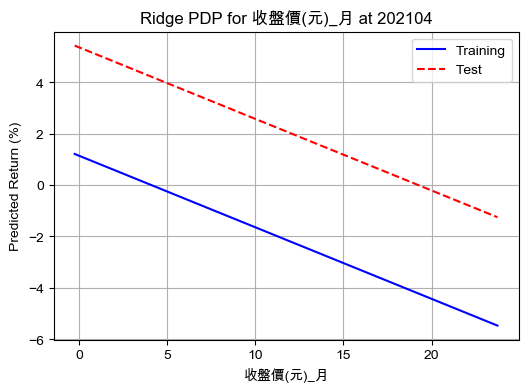

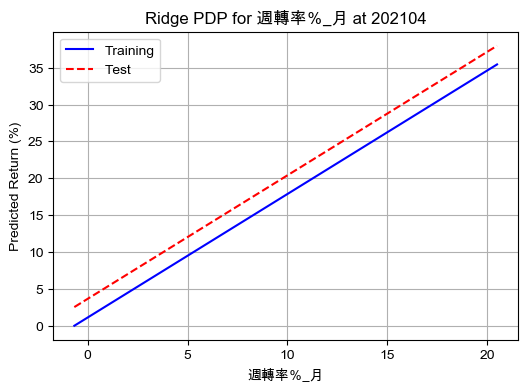

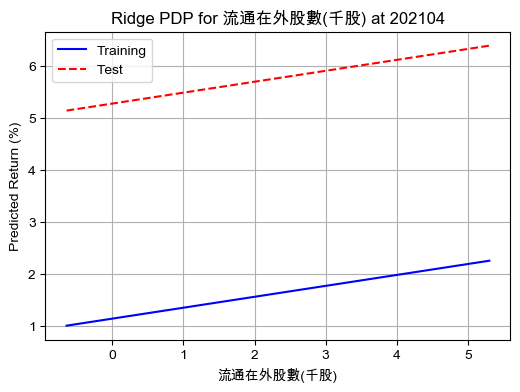

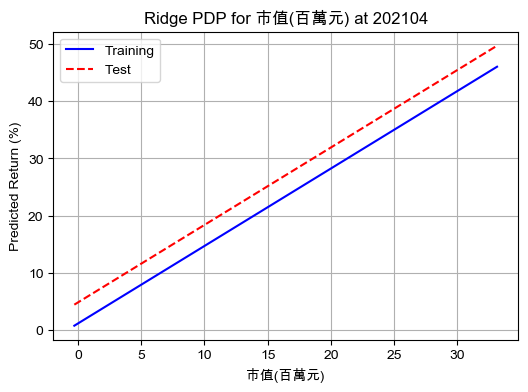

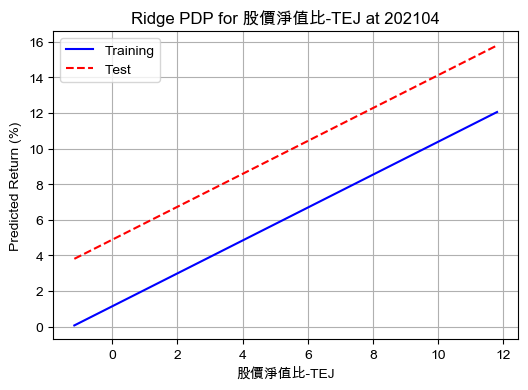

...

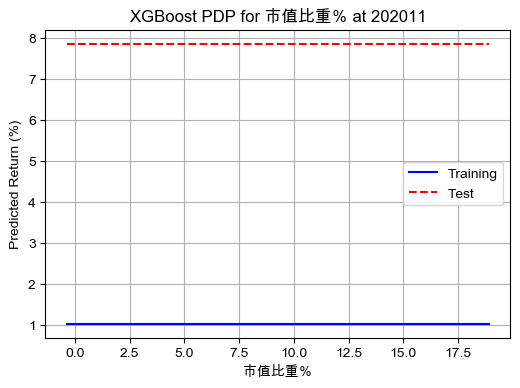

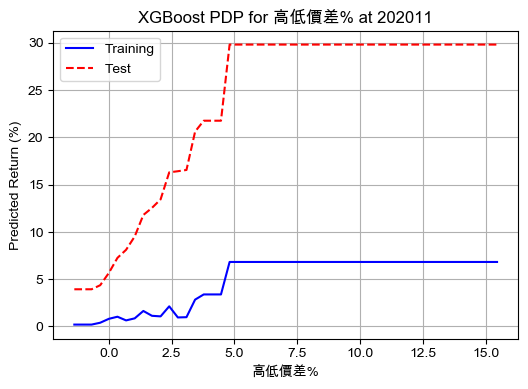

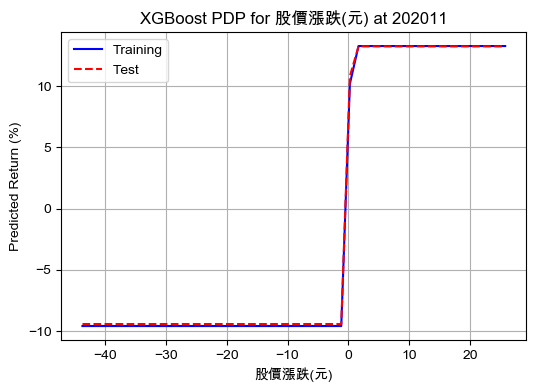

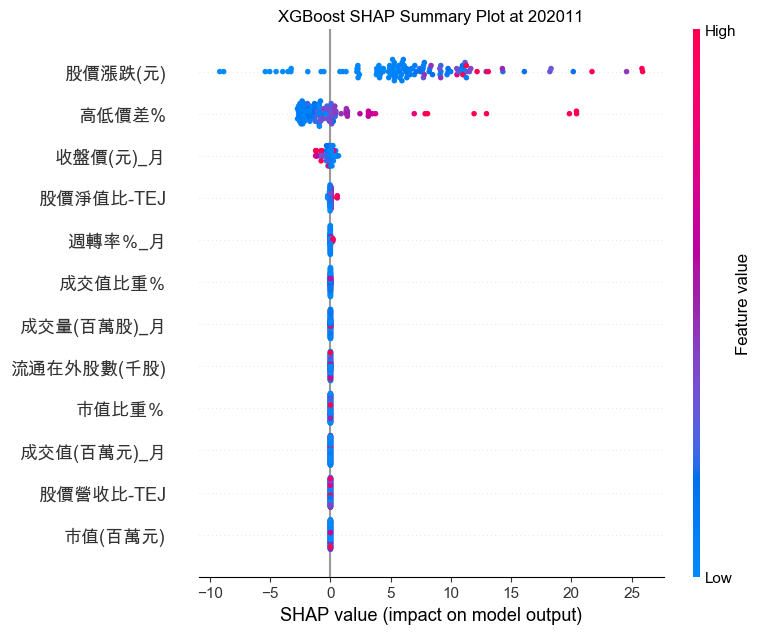

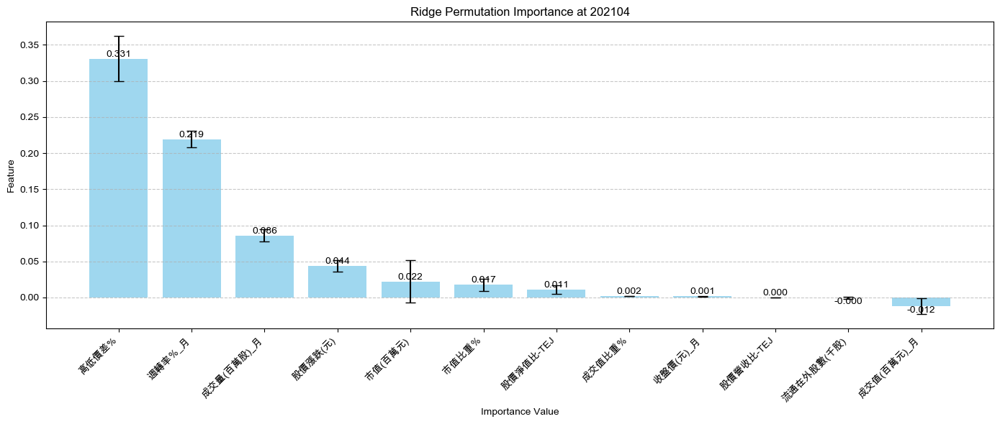


Ridge Permutation Importance at 202107:
       Feature  Importance       Std
8   成交值(百萬元)_月    0.359393  0.083583
11     股價漲跌(元)    0.288524  0.041654
3      市值(百萬元)    0.068350  0.072624
6       成交值比重％    0.028319  0.004580
9        市值比重％    0.024215  0.034514
2   流通在外股數(千股)    0.022379  0.021012
5    股價營收比-TEJ   -0.000385  0.000447
0     收盤價(元)_月   -0.009169  0.004979
4    股價淨值比-TEJ   -0.032415  0.028183
7   成交量(百萬股)_月   -0.087492  0.022788
10       高低價差%   -0.419020  0.076880
1       週轉率％_月   -0.591826  0.125248


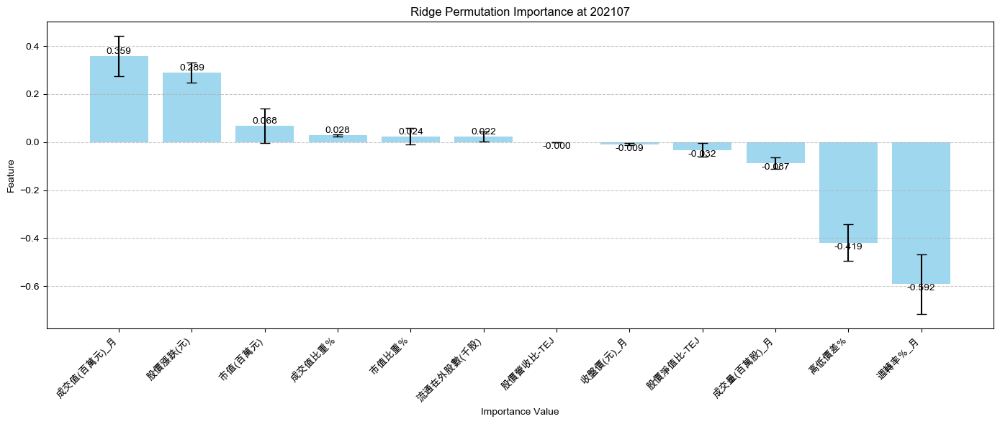


XGBoost Permutation Importance at 202106:
       Feature  Importance       Std
11     股價漲跌(元)    0.856482  0.115647
10       高低價差%    0.774959  0.081236
1       週轉率％_月    0.044220  0.007876
4    股價淨值比-TEJ    0.001328  0.000394
2   流通在外股數(千股)    0.000000  0.000000
5    股價營收比-TEJ    0.000000  0.000000
8   成交值(百萬元)_月    0.000000  0.000000
6       成交值比重％   -0.000002  0.000012
3      市值(百萬元)   -0.000009  0.000051
7   成交量(百萬股)_月   -0.000029  0.000045
9        市值比重％   -0.001621  0.002176
0     收盤價(元)_月   -0.009023  0.014717


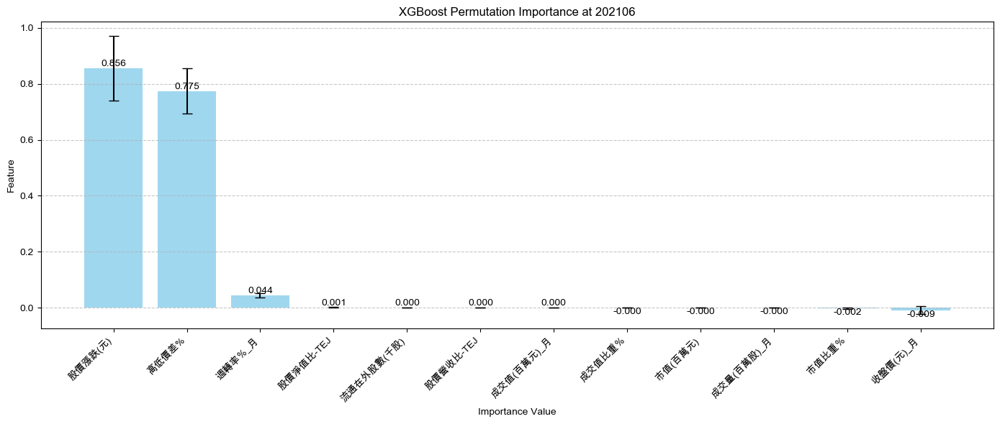


XGBoost Permutation Importance at 202011:
       Feature  Importance       Std
10       高低價差%    0.855217  0.050957
11     股價漲跌(元)    0.463136  0.182744
1       週轉率％_月    0.017994  0.009230
0     收盤價(元)_月    0.015608  0.012545
2   流通在外股數(千股)    0.000000  0.000000
3      市值(百萬元)    0.000000  0.000000
5    股價營收比-TEJ    0.000000  0.000000
8   成交值(百萬元)_月    0.000000  0.000000
9        市值比重％    0.000000  0.000000
7   成交量(百萬股)_月   -0.000149  0.000377
6       成交值比重％   -0.000359  0.000608
4    股價淨值比-TEJ   -0.001518  0.000199


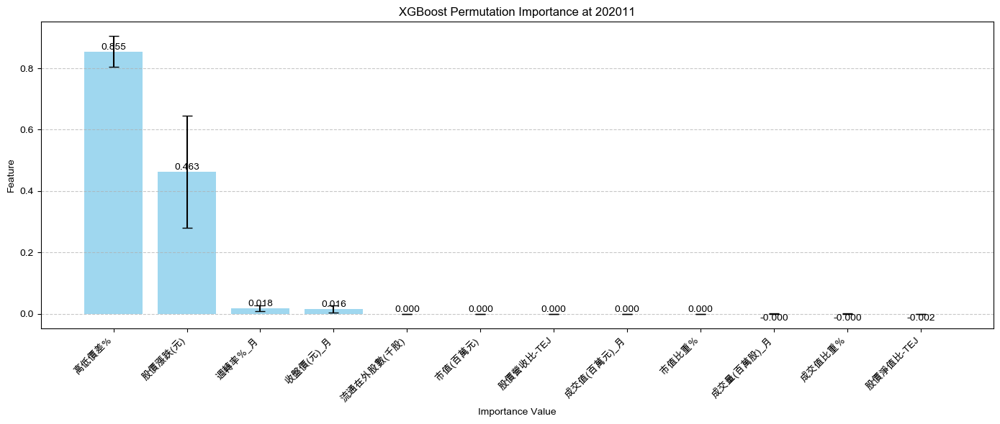

In [ ]:
import matplotlib as mpl
mpl.rcParams['figure.max_open_warning'] = 60

# Find t_max and t_min
tmax_ridge = Ridge_portfolio_df.loc[Ridge_portfolio_df['RLS'].idxmax(), 'date']
tmin_ridge = Ridge_portfolio_df.loc[Ridge_portfolio_df['RLS'].idxmin(), 'date']
tmax_xgb = XGBoost_portfolio_df.loc[XGBoost_portfolio_df['RLS'].idxmax(), 'date']
tmin_xgb = XGBoost_portfolio_df.loc[XGBoost_portfolio_df['RLS'].idxmin(), 'date']
print(f"\nRidge t_max: {tmax_ridge}, t_min: {tmin_ridge}")
print(f"XGBoost t_max: {tmax_xgb}, t_min: {tmin_xgb}")

def analyze_model(date, model_name, train_data, test_data, X_vars, y_var='報酬率％_月', is_ridge=True):
    train_X = train_data[X_vars]
    test_X = test_data[X_vars]
    train_y = train_data[y_var]
    test_y = test_data[y_var]
    
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(train_X)
    X_test_scaled = scaler.transform(test_X)
    
    if model_name == 'Ridge':
        alpha = Ridge_portfolio_df[Ridge_portfolio_df['date'] == date]['best_alpha'].iloc[0] if not Ridge_portfolio_df[Ridge_portfolio_df['date'] == date].empty else 1.0
        model = RidgeCV(alphas=[alpha]).fit(X_train_scaled, train_y)
    else:
        params = XGBoost_portfolio_df[XGBoost_portfolio_df['date'] == date][['max_depth', 'learning_rate', 'n_estimators']].iloc[0].to_dict() if not XGBoost_portfolio_df[XGBoost_portfolio_df['date'] == date].empty else {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100}
        params['n_estimators'] = int(params['n_estimators'])
        params['max_depth'] = int(params['max_depth'])
        model = XGBRegressor(objective='reg:squarederror', random_state = 31073, **params).fit(X_train_scaled, train_y)
    
    print(f"\n{model_name} at {date} - Hyperparameters: {alpha if model_name == 'Ridge' else params}")
    
    # SHAP values
    try:
        explainer = shap.LinearExplainer(model, X_train_scaled) if is_ridge else shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X_test_scaled)
        feature_importance = np.abs(shap_values).mean(axis=0)
        print(f"{model_name} Feature Importance (SHAP) Values:\n{pd.DataFrame({'Feature': X_vars, 'Importance': feature_importance}).sort_values('Importance', ascending=False)}")
    except Exception as e:
        print(f"Warning: SHAP failed ({e}), using Permutation Importance for {model_name}")
        result = permutation_importance(model, X_test_scaled, test_y, n_repeats=5, random_state=42)
        feature_importance = result.importances_mean
        print(f"{model_name} Feature Importance (Permutation) Values:\n{pd.DataFrame({'Feature': X_vars, 'Importance': feature_importance}).sort_values('Importance', ascending=False)}")
    
    importance_df = pd.DataFrame({'Feature': X_vars, 'Importance': feature_importance})
    importance_df = importance_df.sort_values('Importance', ascending=False)
    top2 = importance_df['Feature'].head(2).tolist()
    print(f"Top 2 predictors: {top2}")
    
    return model, top2, importance_df, X_train_scaled, X_test_scaled, train_y, test_y, shap_values

# 主程式
results = {}
for model_name, tmax, tmin in [('Ridge', tmax_ridge, tmin_ridge), ('XGBoost', tmax_xgb, tmin_xgb)]:
    idx_tmax = dates.index(tmax)
    idx_tmin = dates.index(tmin)
    train_tmax = data[data['年月'] <= dates[idx_tmax - 1]]
    test_tmax = data[data['年月'] == tmax]
    train_tmin = data[data['年月'] <= dates[idx_tmin - 1]]
    test_tmin = data[data['年月'] == tmin]
    
    model_tmax, top2_tmax, imp_tmax, X_train_tmax, X_test_tmax, y_train_tmax, y_test_tmax, shap_values_tmax = analyze_model(tmax, model_name, train_tmax, test_tmax, X_vars, is_ridge=(model_name == 'Ridge'))
    model_tmin, top2_tmin, imp_tmin, X_train_tmin, X_test_tmin, y_train_tmin, y_test_tmin, shap_values_tmin = analyze_model(tmin, model_name, train_tmin, test_tmin, X_vars, is_ridge=(model_name == 'Ridge'))
    
    results[model_name] = {
        'tmax': {'top2': top2_tmax, 'importance': imp_tmax, 'shap_values': shap_values_tmax},
        'tmin': {'top2': top2_tmin, 'importance': imp_tmin, 'shap_values': shap_values_tmin},
        'models': {'tmax': model_tmax, 'tmin': model_tmin},
        'data': {'tmax': (X_train_tmax, X_test_tmax, y_train_tmax, y_test_tmax),
                 'tmin': (X_train_tmin, X_test_tmin, y_train_tmin, y_test_tmin)}
    }
    
    if model_name == 'Ridge':
        alpha_tmax = Ridge_portfolio_df[Ridge_portfolio_df['date'] == tmax]['best_alpha'].iloc[0]
        alpha_tmin = Ridge_portfolio_df[Ridge_portfolio_df['date'] == tmin]['best_alpha'].iloc[0]
        print(f"{model_name} Hyperparameter (alpha) differs? {alpha_tmax != alpha_tmin} (t_max: {alpha_tmax}, t_min: {alpha_tmin})")
        print("Note: p-value is NaN due to single value per time point, difference assessed visually.")
    else:
        params_tmax = XGBoost_portfolio_df[XGBoost_portfolio_df['date'] == tmax][['max_depth', 'learning_rate', 'n_estimators']].iloc[0].to_dict()
        params_tmin = XGBoost_portfolio_df[XGBoost_portfolio_df['date'] == tmin][['max_depth', 'learning_rate', 'n_estimators']].iloc[0].to_dict()
        print(f"{model_name} Hyperparameters differ? {params_tmax != params_tmin} (t_max: {params_tmax}, t_min: {params_tmin})")
        print("Note: p-value is NaN due to single value per time point, difference assessed visually.")

def plot_pdp(model, X_train, X_test, feature_idx, feature_name, date, model_name):
    train_vals = np.linspace(X_train[:, feature_idx].min(), X_train[:, feature_idx].max(), 50)
    test_vals = train_vals.copy()
    train_preds, test_preds = [], []
    
    X_train_mod = X_train.copy()
    X_test_mod = X_test.copy()
    
    for val in train_vals:
        X_train_mod[:, feature_idx] = val
        X_test_mod[:, feature_idx] = val
        train_preds.append(model.predict(X_train_mod).mean())
        test_preds.append(model.predict(X_test_mod).mean())
    
    plt.figure(figsize=(6, 4))
    plt.plot(train_vals, train_preds, 'b-', label='Training')
    plt.plot(test_vals, test_preds, 'r--', label='Test')
    plt.title(f'{model_name} PDP for {feature_name} at {date.strftime("%Y%m")}')
    plt.xlabel(feature_name)
    plt.ylabel('Predicted Return (%)')
    plt.legend()
    plt.grid()
    plt.savefig(f'{model_name.lower()}_pdp_{feature_name}_{date.strftime("%Y%m")}.png')
    # plt.close()
    
    # corr, _ = pearsonr(train_preds, test_preds)
    # print(f"PDP Correlation between Training and Test for {feature_name} at {date.strftime('%Y%m')}: {corr:.4f}")
    # if corr > 0.9:
    #     print("Relationship between predictor and return is stable.")
    # else:
    #     print("Relationship between predictor and return may not be stable.")

def plot_shap_summary(shap_values, X_test, model_name, date, X_vars):
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test, feature_names=X_vars, show=False)
    plt.title(f'{model_name} SHAP Summary Plot at {date.strftime("%Y%m")}')
    plt.savefig(f'{model_name.lower()}_shap_summary_{date.strftime("%Y%m")}.png')
    # plt.close()

for model_name in ['Ridge', 'XGBoost']:
    for period, date in [('tmax', tmax_ridge if model_name == 'Ridge' else tmax_xgb), ('tmin', tmin_ridge if model_name == 'Ridge' else tmin_xgb)]:
        model = results[model_name]['models'][period]
        X_train, X_test, _, _ = results[model_name]['data'][period]
        top2 = results[model_name][period]['top2']
        shap_values = results[model_name][period]['shap_values']
        
        # Plot PDP for all 12 predictors
        for feat in X_vars:
            feat_idx = X_vars.index(feat)
            plot_pdp(model, X_train, X_test, feat_idx, feat, date, model_name)
        
        # Plot SHAP summary
        plot_shap_summary(shap_values, X_test, model_name, date, X_vars)
    
    tmax_top2 = results[model_name]['tmax']['top2']
    tmin_top2 = results[model_name]['tmin']['top2']
    same_predictors = set(tmax_top2) == set(tmin_top2)
    print(f"\n{model_name} - Are top predictors same in t_max and t_min? {same_predictors}")
    if same_predictors and tmax_top2:
        print(f"Top predictors: {tmax_top2}")
        print("PDP plots have been checked for stability (see correlation analysis above).")
    else:
        print("Top predictors differ. Stability analysis not applicable.")

# # Save feature importance results
# for model_name in ['Ridge', 'XGBoost']:
#     for period, date in [('tmax', tmax_ridge if model_name == 'Ridge' else tmax_xgb), ('tmin', tmin_ridge if model_name == 'Ridge' else tmin_xgb)]:
#         results[model_name][period]['importance'].to_csv(f'{model_name.lower()}_importance_{date.strftime("%Y%m")}.csv', index=False)

# plot permutation-based feature importance
def plot_permutation_importance(model, X_test, y_test, X_vars, model_name, date):
    perm_result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)
    perm_importance = perm_result.importances_mean
    perm_std = perm_result.importances_std  

    perm_importance_df = pd.DataFrame({
        'Feature': X_vars,
        'Importance': perm_importance,
        'Std': perm_std
    })
    perm_importance_df = perm_importance_df.sort_values('Importance', ascending=False)
    print(f"\n{model_name} Permutation Importance at {date.strftime('%Y%m')}:\n{perm_importance_df}")

    # plot permutation importance
    plt.figure(figsize=(14, 6))
    bars = plt.bar(perm_importance_df['Feature'], perm_importance_df['Importance'], 
                   yerr=perm_importance_df['Std'], capsize=5, color='skyblue', alpha=0.8)
    plt.xlabel('Importance Value')
    plt.ylabel('Feature')
    plt.title(f'{model_name} Permutation Importance at {date.strftime("%Y%m")}')
    plt.xticks(rotation=45, ha='right')  
    plt.grid(True, axis='y', linestyle='--', alpha=0.7) 

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.3f}',
                 ha='center', va='bottom' if height >= 0 else 'top')

    plt.tight_layout()
    plt.savefig(f'{model_name.lower()}_permutation_importance_{date.strftime("%Y%m")}.png')
    plt.show()  
    plt.close()  

    return perm_importance_df

# plot permutation importance
for model_name in ['Ridge', 'XGBoost']:  
    for period, date in [('tmax', tmax_ridge if model_name == 'Ridge' else tmax_xgb), ('tmin', tmin_ridge if model_name == 'Ridge' else tmin_xgb)]:
        model = results[model_name]['models'][period]
        X_test, y_test = results[model_name]['data'][period][1], results[model_name]['data'][period][3]
        perm_importance_df = plot_permutation_importance(model, X_test, y_test, X_vars, model_name, date)
        # perm_importance_df.to_csv(f'{model_name.lower()}_permutation_importance_{date.strftime("%Y%m")}.csv', index=False)

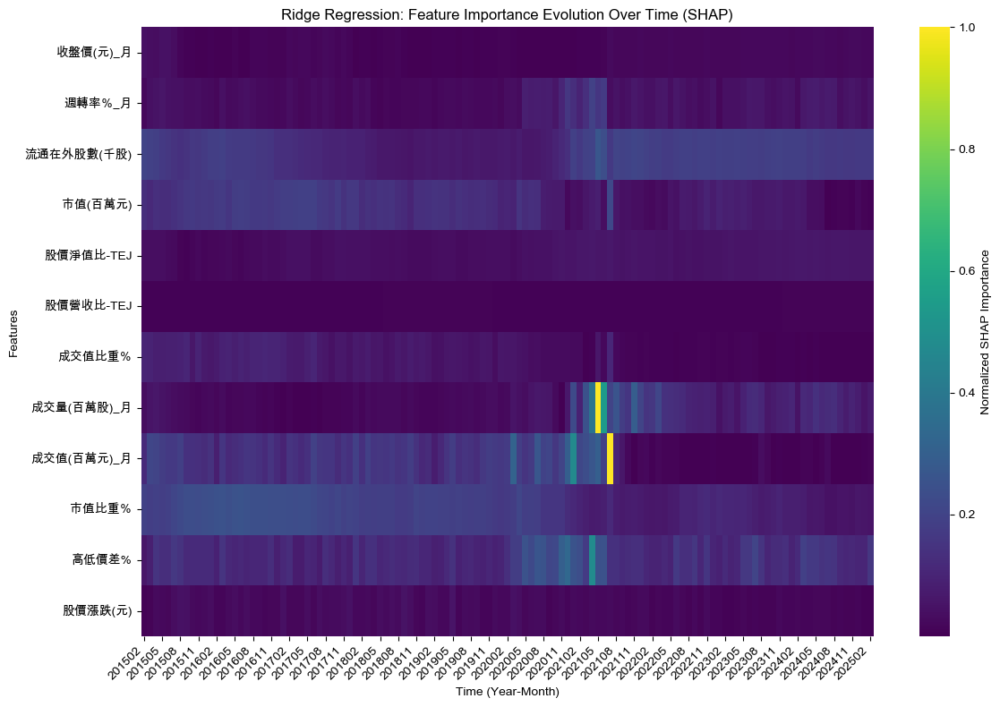

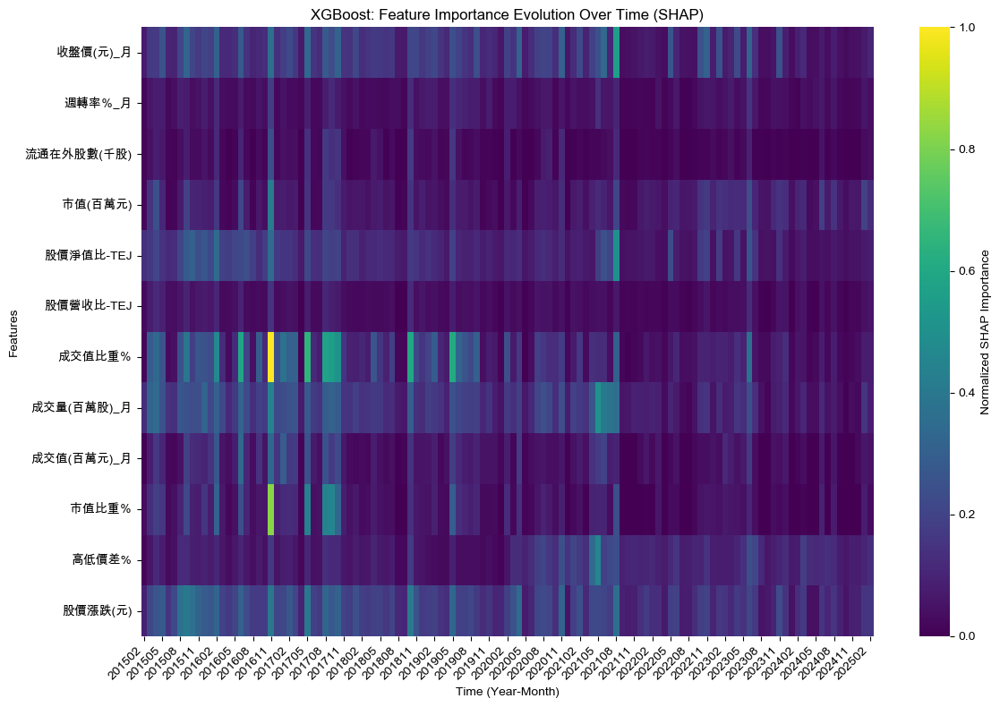

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
from xgboost import XGBRegressor
import shap

ridge_feature_importance = {feat: [] for feat in X_vars}
xgb_feature_importance = {feat: [] for feat in X_vars}
time_periods = []

def compute_shap_importance(model, X_test_scaled, X_vars, is_ridge=True):
    explainer = shap.LinearExplainer(model, X_test_scaled) if is_ridge else shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_test_scaled)
    feature_importance = np.abs(shap_values).mean(axis=0) 
    return feature_importance

# 主程式
dates = sorted(data['年月'].unique())
for t in dates_to_predict:
    t_index = dates.index(t)
    if t_index + 1 >= len(dates):
        continue
    t_plus_1 = dates[t_index + 1]
    
    train_data = data[data['年月'] < t].copy()
    train_data['y'] = train_data.groupby('證券代碼')['報酬率％_月'].shift(-1)
    train_data = train_data.dropna(subset=['y'])
    test_data_t = data[data['年月'] == t]
    
    X = train_data[X_vars]
    y = train_data['y']
    X_test = test_data_t[X_vars]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_test_scaled = scaler.transform(X_test)
    
    # Ridge
    alpha = Ridge_portfolio_df[Ridge_portfolio_df['date'] == t_plus_1]['best_alpha'].iloc[0] if not Ridge_portfolio_df[Ridge_portfolio_df['date'] == t_plus_1].empty else 1.0
    ridge = RidgeCV(alphas=[alpha]).fit(X_scaled, y)
    ridge_importance = compute_shap_importance(ridge, X_test_scaled, X_vars, is_ridge=True)
    
    # XGBoost
    params = XGBoost_portfolio_df[XGBoost_portfolio_df['date'] == t_plus_1][['max_depth', 'learning_rate', 'n_estimators']].iloc[0].to_dict() if not XGBoost_portfolio_df[XGBoost_portfolio_df['date'] == t_plus_1].empty else {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100}
    params['n_estimators'] = int(params['n_estimators'])
    params['max_depth'] = int(params['max_depth'])
    xgb = XGBRegressor(objective='reg:squarederror', random_state=31073, **params).fit(X_scaled, y)
    xgb_importance = compute_shap_importance(xgb, X_test_scaled, X_vars, is_ridge=False)
    
    for feat, imp in zip(X_vars, ridge_importance):
        ridge_feature_importance[feat].append(imp)
    for feat, imp in zip(X_vars, xgb_importance):
        xgb_feature_importance[feat].append(imp)
    
    time_periods.append(t.strftime('%Y%m'))

ridge_importance_df = pd.DataFrame(ridge_feature_importance, index=time_periods)
xgb_importance_df = pd.DataFrame(xgb_feature_importance, index=time_periods)

ridge_importance_df = ridge_importance_df.div(ridge_importance_df.max().max())
xgb_importance_df = xgb_importance_df.div(xgb_importance_df.max().max())

# Ridge
plt.figure(figsize=(12, 8))
sns.heatmap(ridge_importance_df.T, cmap='viridis', annot=False, cbar_kws={'label': 'Normalized SHAP Importance'})
plt.title('Ridge Regression: Feature Importance Evolution Over Time (SHAP)')
plt.xlabel('Time (Year-Month)')
plt.ylabel('Features')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('ridge_feature_importance_heatmap.png')
plt.show()
plt.close()

# XGBoost
plt.figure(figsize=(12, 8))
sns.heatmap(xgb_importance_df.T, cmap='viridis', annot=False, cbar_kws={'label': 'Normalized SHAP Importance'})
plt.title('XGBoost: Feature Importance Evolution Over Time (SHAP)')
plt.xlabel('Time (Year-Month)')
plt.ylabel('Features')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('xgboost_feature_importance_heatmap.png')
plt.show()
plt.close()